# Learning Curve Analysis - Codebrim

In [ ]:
!nvidia-smi

Mon Oct  3 19:49:53 2022       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 460.32.03    Driver Version: 460.32.03    CUDA Version: 11.2     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla T4            Off  | 00000000:00:04.0 Off |                    0 |
| N/A   48C    P8     9W /  70W |      0MiB / 15109MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

## Setup

In [ ]:
!pip install hub urllib3==1.26.7 torchmetrics iterative-stratification timm pytorch-lightning --quiet

     |████████████████████████████████| 138 kB 31.5 MB/s 
     |████████████████████████████████| 419 kB 59.6 MB/s 
     |████████████████████████████████| 509 kB 73.6 MB/s 
     |████████████████████████████████| 708 kB 70.0 MB/s 
     |████████████████████████████████| 437 kB 38.4 MB/s 
     |████████████████████████████████| 5.9 MB 54.9 MB/s 
     |████████████████████████████████| 62 kB 1.6 MB/s 
     |████████████████████████████████| 10.5 MB 41.3 MB/s 
     |████████████████████████████████| 76 kB 2.1 MB/s 
     |████████████████████████████████| 6.6 MB 7.2 MB/s 
     |████████████████████████████████| 132 kB 49.0 MB/s 
     |████████████████████████████████| 79 kB 8.2 MB/s 
     |████████████████████████████████| 9.2 MB 53.2 MB/s 
     |████████████████████████████████| 115 kB 59.0 MB/s 
     |████████████████████████████████| 52 kB 1.4 MB/s 
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of

In [ ]:
!wget https://github.com/matomo-org/travis-scripts/raw/master/fonts/Arial.ttf

--2022-10-03 19:50:23--  https://github.com/matomo-org/travis-scripts/raw/master/fonts/Arial.ttf
Resolving github.com (github.com)... 20.205.243.166
Connecting to github.com (github.com)|20.205.243.166|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://raw.githubusercontent.com/matomo-org/travis-scripts/master/fonts/Arial.ttf [following]
--2022-10-03 19:50:23--  https://raw.githubusercontent.com/matomo-org/travis-scripts/master/fonts/Arial.ttf
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 275572 (269K) [application/octet-stream]
Saving to: ‘Arial.ttf’

Arial.ttf           100%[===================>] 269.11K  --.-KB/s    in 0.004s  

2022-10-03 19:50:23 (71.3 MB/s) - ‘Arial.ttf’ saved [275572/275572]



In [ ]:
import json
import pickle
import warnings
from copy import copy, deepcopy
from getpass import getpass
from pathlib import Path
from typing import Any, Callable, Dict, List, Tuple

import random
import cv2
import hub
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import pytorch_lightning as pl
import timm  # https://rwightman.github.io/pytorch-image-models/
import torch
import torch.nn as nn
import torch.nn.functional as F
import torchmetrics
import torchvision
import seaborn as sns
from iterstrat.ml_stratifiers import (MultilabelStratifiedKFold,
                                      MultilabelStratifiedShuffleSplit)
from matplotlib import pyplot as plt
from PIL import Image, ImageDraw, ImageFont
from pytorch_lightning import Callback, Trainer, seed_everything
from pytorch_lightning.callbacks import EarlyStopping, ModelCheckpoint
from pytorch_lightning.loggers import CSVLogger
from sklearn.metrics import f1_score, accuracy_score, recall_score, precision_score
from torch.utils.data import DataLoader, Dataset
from torchvision import transforms, utils
from tqdm.notebook import tqdm

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
class_names = ["Background", "Crack", "Spallation", "Efflorescence", "ExposedBars", "CorrosionStain"]

# Ignore background class for classification task
class_names_classification = ["Crack", "Spallation", "Efflorescence", "ExposedBars", "CorrosionStain"]

## Load Data and Args

In [ ]:
data_url = "hub://luizapzbn/CODEBRIM_original_images_od"
codebrim_ds = hub.load(data_url, token=getpass(prompt='Token: ', stream=None))

Token: ··········
hub://luizapzbn/CODEBRIM_original_images_od loaded successfully.
This dataset can be visualized in Jupyter Notebook by ds.visualize() or at https://app.activeloop.ai/luizapzbn/CODEBRIM_original_images_od


In [ ]:
# General learning curve analysis config

class args:
    total_size = len(codebrim_ds)
    test_size = 152
    max_training_size = total_size - test_size
    training_sizes = list(np.linspace(start=100, stop=max_training_size, num=9, dtype=int))
    models_dir = Path("/content/drive/MyDrive/Trabalho/Fruitpunch/AI for damage inspection/models/")

print(args.training_sizes)

[100, 200, 300, 400, 500, 600, 700, 800, 900]


In [ ]:
# Training config

DEBUG = False

class CFG:
    seed = 42
    model_name = "vit_small_patch32_384"  # 'tf_efficientnet_b5_ns'
    pretrained = True
    img_size = 384  # 512
    num_classes = len(class_names_classification)
    lr = 5e-5
    num_epochs = 20
    batch_size = 32
    accum = 1
    precision = 16
    device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

def seed_all(seed):
    torch.manual_seed(seed)
    random.seed(seed)
    np.random.seed(seed)

seed_all(CFG.seed)

### Display sample

In [ ]:
sample = codebrim_ds[10]
image = sample["images"].numpy()
labels = sample["boxes/labels"].numpy()
bboxes = sample["boxes/bbox"].numpy()

In [ ]:
labels

array([[0, 0, 0, 0, 1, 0],
       [0, 0, 0, 0, 1, 0],
       [0, 0, 0, 0, 1, 0],
       [0, 0, 0, 0, 1, 0]], dtype=uint32)

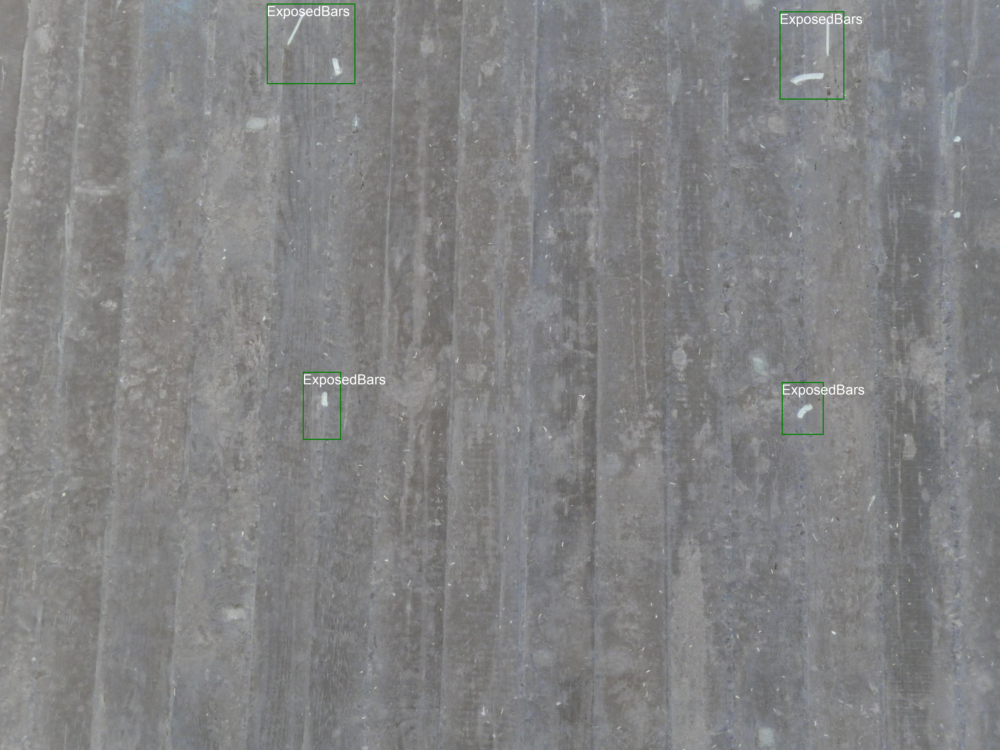

In [ ]:
sample_image = Image.fromarray(image)
sample_image_annotated = sample_image.copy()

img_bbox = ImageDraw.Draw(sample_image_annotated)
font = ImageFont.truetype("/content/Arial.ttf", 64)

for bbox, bbox_labels in zip(bboxes, labels):
    labels_text = ', '.join([class_names[idx] for idx in np.where(bbox_labels)[0]])
    img_bbox.rectangle(bbox, outline="green", width=5) 
    img_bbox.text((bbox[0], bbox[1]), labels_text, font=font)

sample_image_annotated

# Code

## Prepare splits strategy for Learning Curve Analysis


In [ ]:
def get_original_targets(original_targets_path: Path = Path("original_targets.pkl")) -> List:
    """Fetch and save original targets for a multilabel classification problem."""
    if original_targets_path.exists():
        with open(original_targets_path, "rb") as f:
            original_targets = pickle.load(f)
    else:
        original_targets = [np.logical_or.reduce(item["boxes/labels"].numpy().astype(np.uint8)) for item in tqdm(codebrim_ds)]
        
        with open(original_targets_path, "wb") as f:
            pickle.dump(original_targets, f)
    return original_targets

def process_multilabel_targets(codebrim_ds: Any) -> np.array:
    """Process targets for multilabel classification problem."""
    original_targets = get_original_targets()
    targets = []
    for i, target in tqdm(enumerate(original_targets)):
        if target.shape == (0,):
            targets.append(np.zeros((5,)).astype(bool))
        else:
            targets.append(target[1:])
    targets = np.stack(targets)
    return targets

def stratified_train_test_split(test_size: int, n_splits: int = 2, random_state: int = 42) -> Callable:
    """Generate train/test stratified split callable functions."""
    # Stratified train/val/test multilabel splits
    test_split = MultilabelStratifiedShuffleSplit(n_splits=n_splits, test_size=test_size, random_state=random_state)
    train_split = MultilabelStratifiedShuffleSplit(n_splits=n_splits, test_size=0.2, random_state=random_state)
    return train_split, test_split

def get_train_test_idx(test_split: Callable, targets: np.array) -> Tuple[np.array, np.array]:
    """Get fixed train/test indexes."""
    train_idx, test_idx = next(iter(test_split.split(targets, targets)))
    return train_idx, test_idx

def get_training_set(train_size: int, train_targets: np.array, train_idx: np.array) -> np.array:
    """Get current training set indexes accordingly to available `training_sizes`."""
    maximum_training_size = train_targets.shape[0]
    if train_size != maximum_training_size:
        # Select a stratified sample corresponding to this run's training set size
        # Due to stratified split, it is not guaranteed `train_size` will be respected at risk
        run_split = MultilabelStratifiedShuffleSplit(
            n_splits=2, test_size=train_size, random_state=42)

        _, curr_train_idx = next(iter(run_split.split(train_targets, train_targets)))
        
        original_curr_train_idx, curr_train_targets = (
            train_idx[curr_train_idx], 
            train_targets[curr_train_idx]
        )
    else:
        curr_train_idx = list(range(train_targets.shape[0]))
        original_curr_train_idx, curr_train_targets = train_idx, train_targets

    return original_curr_train_idx, curr_train_idx, curr_train_targets

def get_train_val_idx(train_split: Callable, train_targets: np.array, original_train_idx: np.array) -> Tuple:
    """Get training/validation indexes for this analysis run.
    
    The returned indexes are regarding the original available indexes.
    The `train_targets` and `original_train_idx` are expected to be for the desired
    training set size.
    
    """
    train_idx, val_idx = next(iter(train_split.split(train_targets, train_targets)))
    original_train_idx, original_val_idx = original_train_idx[train_idx], original_train_idx[val_idx]
    return original_train_idx, original_val_idx

def train_val_test_generation(targets: np.array, train_size: int) -> Tuple:
    """Get actual train/val/test indexes."""
    # Generate train/test splits
    train_split, test_split = stratified_train_test_split(args.test_size)
    # Get train/test indexes
    train_idx, test_idx = get_train_test_idx(test_split, targets)
    train_targets = targets[train_idx]

    # Get current training/validation dataset for this `train_size`
    original_curr_trainval_idx, curr_trainval_idx, curr_trainval_targets = get_training_set(train_size, train_targets, train_idx)
    # Get current validation dataset for this `train_size` (20% of train_size)
    original_curr_train_idx, original_curr_val_idx = get_train_val_idx(train_split, curr_trainval_targets, original_curr_trainval_idx)

    extra_data = {
         "original_train_idx": train_idx,
         "original_curr_trainval_idx": original_curr_trainval_idx, 

    }
    return original_curr_train_idx, original_curr_val_idx, test_idx, extra_data

def test_train_val_test_generation(targets, train_size: int) -> None:
    """Test that the sets are correctly separated."""
    train_idx, val_idx, test_idx, extra = train_val_test_generation(targets, train_size)

    original_train_idx = extra["original_train_idx"]
    original_curr_trainval_idx = extra["original_curr_trainval_idx"]
    
    ### Checks
    assert len(train_idx) > len(val_idx)
    assert len(test_idx) == args.test_size

    # All indexes of current training dataset should be in the full training dataset
    assert set(train_idx).intersection(original_train_idx) == set(train_idx)

    # No index of test set should be in full_train_ds nor curr_train_ds
    assert set(test_idx).intersection(train_idx) == set()
    assert set(test_idx).intersection(train_idx) == set()

    # All indexes of train and val sets should be contained in curr_train
    assert set(train_idx).intersection(original_curr_trainval_idx) == set(train_idx)
    assert set(val_idx).intersection(original_curr_trainval_idx) == set(val_idx)

## Learning Curve execution

In [ ]:
class CODEBRIM(Dataset):
    def __init__(self, codebrim_ds, indexes=None, transform=None):
        """
        Args:
            transform (callable, optional): Optional transform to be applied
                on a sample.
        """
        self.ds = codebrim_ds
        self.indexes = indexes
        self.transform = transform

    def __len__(self):
        return len(self.indexes)

    def __getitem__(self, idx):
        actual_idx = int(self.indexes[idx])
        sample = self.ds[actual_idx]
        image = sample["images"].numpy()
        targets = sample["boxes/labels"].numpy()

        targets = np.logical_or.reduce(targets).astype(np.uint8)
        if targets.shape == (0,):
            targets = np.zeros((6,)).astype(np.uint8)

        targets = targets[1:]
        
        if self.transform:
            image = self.transform(image)

        return image, targets

In [ ]:
def get_loaders(targets: np.array, train_size: int) -> Tuple[DataLoader]:
    train_idx, val_idx, test_idx, extra = train_val_test_generation(targets, train_size)

    model = timm.create_model(CFG.model_name)
    mean, std = model.default_cfg['mean'], model.default_cfg['std']

    composed = transforms.Compose([
        transforms.ToPILImage(),
        transforms.Resize(CFG.img_size + 64),
        transforms.RandomCrop(CFG.img_size),
        transforms.ToTensor(),
        transforms.Normalize(mean, std)
    ])

    composed_test = transforms.Compose([
        transforms.ToPILImage(),
        transforms.Resize((CFG.img_size, CFG.img_size)),
        transforms.ToTensor(),
        transforms.Normalize(mean, std)
    ])
    del model

    train_ds = CODEBRIM(codebrim_ds=codebrim_ds, indexes=train_idx, transform=composed)
    val_ds = CODEBRIM(codebrim_ds=codebrim_ds, indexes=val_idx, transform=composed_test)
    test_ds = CODEBRIM(codebrim_ds=codebrim_ds, indexes=test_idx, transform=composed_test)

    # https://efficientdl.com/faster-deep-learning-in-pytorch-a-guide/#2-use-multiple-workers-and-pinned-memory-in-dataloader

    train_loader = DataLoader(
        train_ds, 
        batch_size=CFG.batch_size,
        shuffle=True, 
        num_workers=0,
    )
    val_loader = DataLoader(
        val_ds, 
        batch_size=CFG.batch_size,
        shuffle=False, 
        pin_memory=True,
        num_workers=0,
    )
    test_loader = DataLoader(
        test_ds, 
        batch_size=CFG.batch_size,
        shuffle=False, 
        pin_memory=True,
        num_workers=0,
    )

    metadata = {
        "total_training_size": len(train_idx) + len(val_idx),
        "desired_training_size": train_size,
        "train_size": len(train_ds),
        "val_size": len(val_ds),
        "test_size": len(test_ds)
    }

    return train_loader, val_loader, test_loader, metadata

def show(img):
    npimg = img.numpy()
    plt.imshow(np.transpose(npimg, (1,2,0)), interpolation='nearest')

### Test datasets and dataloaders creation

In [ ]:
targets = process_multilabel_targets(codebrim_ds)

# Test code
for train_size in args.training_sizes:
    test_train_val_test_generation(targets=targets, train_size=train_size)

{class_name: val for class_name, val in zip(class_names_classification, np.sum(targets, axis=0))}

0it [00:00, ?it/s]

{'Crack': 629,
 'Spallation': 563,
 'Efflorescence': 320,
 'ExposedBars': 446,
 'CorrosionStain': 573}

In [ ]:
# Test index from original codebrim dataset
_, _, test_idx, _ = train_val_test_generation(targets, 900)
print(test_idx)

[   4    8   14   21   35   47   80  105  122  130  134  138  143  146
  152  159  162  183  186  189  200  201  205  219  224  232  233  240
  242  251  258  270  273  282  288  293  315  330  339  343  345  374
  376  379  385  386  387  391  392  397  403  406  415  454  459  460
  471  476  484  489  492  496  505  555  561  563  565  566  606  609
  619  632  637  638  645  646  647  648  659  669  674  681  683  686
  691  701  702  709  724  725  726  735  738  740  743  748  763  765
  766  768  769  775  791  795  797  804  806  811  815  820  825  826
  831  832  839  840  846  856  857  862  863  869  878  897  905  910
  911  914  921  923  925  942  946  948  955  956  959  966  967  972
  975  993 1002 1010 1016 1017 1027 1033 1039 1042 1044 1047]


In [ ]:
run_idx = 0
train_size = args.training_sizes[run_idx]
train_loader, val_loader, test_loader, metadata = get_loaders(targets, train_size)

metadata

{'total_training_size': 104,
 'desired_training_size': 100,
 'train_size': 78,
 'val_size': 26,
 'test_size': 152}

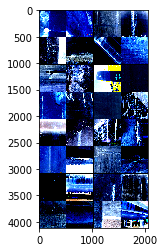

In [ ]:
imgs, targets = next(iter(train_loader))
grid_img = torchvision.utils.make_grid(imgs, nrow=4)
show(grid_img)

## Boilerplate multi-label classification with pytorch lightning

https://www.kaggle.com/code/falloutbabe/pp-2021-multi-label-model


In [ ]:
class CustomModel(nn.Module):
    def __init__(self, model_name, pretrained=True):
        super().__init__()
        self.model = timm.create_model(model_name, pretrained=pretrained, num_classes=CFG.num_classes)

    def forward(self, x):
        x = self.model(x)
        return x

class LitCassava(pl.LightningModule):
    def __init__(self, model_name, pretrained=True):
        super(LitCassava, self).__init__()
        self.model = CustomModel(model_name=model_name, pretrained=True)
        self.criterion = nn.BCEWithLogitsLoss()
        self.sigmoid = nn.Sigmoid()

        # https://github.com/Lightning-AI/metrics/discussions/526
        # treating as binary classification classification problem of damage vs. non-damage
        self.accuracy = torchmetrics.Accuracy(num_classes=1) 
        self.recall = torchmetrics.Recall(num_classes=1)
        self.f1 = torchmetrics.F1Score(num_classes=1)

        self.lr = CFG.lr

    def compute_metrics(self, preds, targets):
        preds, targets = preds.reshape(-1), targets.reshape(-1)
        acc = self.accuracy(preds, targets)
        recall = self.recall(preds, targets)
        f1 = self.f1(preds, targets)
        return acc, recall, f1

    def forward(self, x, *args, **kwargs):
        return self.model(x)

    def configure_optimizers(self):
        self.optimizer = torch.optim.Adam(self.model.parameters(), lr=self.lr)
        return [self.optimizer]

    def training_step(self, batch, batch_idx):
        image, target = batch
        output = self.model(image)
        loss = self.criterion(output, target.float())
        acc, recall, f1 = self.compute_metrics(
            self.sigmoid(output), target.clone().detach().to(torch.int32))
        logs = {
            'train_loss': loss, 
            'lr': self.optimizer.param_groups[0]['lr'],
            'train_accuracy': acc,
            'train_recall': recall,
            'train_f1': f1,
        }
        self.log_dict(
            logs,
            on_step=False, on_epoch=True, prog_bar=True, logger=True
        )
        return loss
    
    def validation_step(self, batch, batch_idx):
        image, target = batch
        output = self.model(image)
        loss = self.criterion(output, target.float())
        acc, recall, f1 = self.compute_metrics(
            self.sigmoid(output), target.clone().detach().to(torch.int32))
        logs = {
            'valid_loss': loss,
            'valid_accuracy': acc,
            'valid_recall': recall,
            'valid_f1': f1,
        }
        self.log_dict(
            logs,
            on_step=False, on_epoch=True, prog_bar=True, logger=True
        )
        return loss

    def test_step(self, batch, batch_idx):
        image, target = batch
        output, pred = self.predict(image)
        loss = self.criterion(output, target.float())
        logs = {'test_loss': loss}
        self.log_dict(
            logs,
            on_step=False, on_epoch=True, logger=True
        )

In [ ]:
ModelCheckpoint??

In [ ]:
# idx = -1
# train_size = args.training_sizes[idx]
train_size = 900
targets = process_multilabel_targets(codebrim_ds)
train_loader, val_loader, test_loader, metadata = get_loaders(targets, train_size)
print(metadata)

lit_model = LitCassava(model_name=CFG.model_name, pretrained=CFG.pretrained)

save_path = Path(f'/content/drive/MyDrive/Trabalho/Fruitpunch/AI for damage inspection/models/{args.models_dir}/train_size_{train_size}')

logger = CSVLogger(save_dir=save_path or 'logs/', name=CFG.model_name)
logger.log_hyperparams(CFG.__dict__)
checkpoint_callback = ModelCheckpoint(dirpath=save_path,
                                      monitor='valid_f1',
                                      mode="max",
                                      save_top_k=1,
                                      save_last=True,
                                      save_weights_only=False, # True
                                      filename='{epoch:02d}-{valid_loss:.4f}-{valid_f1:.4f}',
                                      verbose=False)

CFG.steps_per_epoch = len(train_loader)
CFG.num_epochs = 20

trainer = Trainer(
    max_epochs=CFG.num_epochs,
    accelerator='gpu', 
    devices=[0],
    accumulate_grad_batches=CFG.accum,
    precision=CFG.precision,
    callbacks=[checkpoint_callback],
    logger=logger,
    log_every_n_steps=1
)

0it [00:00, ?it/s]

{'total_training_size': 900, 'desired_training_size': 900, 'train_size': 719, 'val_size': 181, 'test_size': 152}


INFO:pytorch_lightning.utilities.rank_zero:Using 16bit native Automatic Mixed Precision (AMP)
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


In [ ]:
trainer.fit(lit_model, train_loader, val_loader)

/usr/local/lib/python3.7/dist-packages/pytorch_lightning/callbacks/model_checkpoint.py:616: UserWarning: Checkpoint directory /content/drive/MyDrive/Trabalho/Fruitpunch/AI for damage inspection/models/content/drive/MyDrive/Trabalho/Fruitpunch/AI for damage inspection/models/train_size_900 exists and is not empty.
  rank_zero_warn(f"Checkpoint directory {dirpath} exists and is not empty.")
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.callbacks.model_summary:
  | Name      | Type              | Params
------------------------------------------------
0 | model     | CustomModel       | 28.4 M
1 | criterion | BCEWithLogitsLoss | 0     
2 | sigmoid   | Sigmoid           | 0     
3 | accuracy  | Accuracy          | 0     
4 | recall    | Recall            | 0     
5 | f1        | F1Score           | 0     
------------------------------------------------
28.4 M    Trainable params
0         Non-trainable params
28.4 M    Total para

Sanity Checking: 0it [00:00, ?it/s]

Training: 0it [00:00, ?it/s]

RuntimeError: ignored

In [ ]:
''' lit_output_dir = Path(f"/content/logs/{CFG.model_name}/")
last_run_folder_name = sorted(list(lit_output_dir.glob("version*")))[-1]
actual_run_folder = str(lit_output_dir / last_run_folder_name)
drive_save_folder = args.models_dir / f"train_size_{train_size}"

!rm -rf "{drive_save_folder}"
!cp -r "{actual_run_folder}" "{drive_save_folder}"
!rm -rf "{lit_output_dir}" # clean colab directory after saving the model

print(f"Saved to: {drive_save_folder}") '''

### Evaluate

In [ ]:
def get_checkpoint(train_size: int, mode="best"):
    drive_save_folder = args.models_dir / f"train_size_{train_size}"
    if mode == "best":
        ckpt_path = list(drive_save_folder.glob("checkpoints/epoch*"))[0]
    elif mode == "last":
        ckpt_path = drive_save_folder / "checkpoints/last.ckpt"
    return ckpt_path

paths = {}
for run_folder in sorted(list(args.models_dir.glob("train_size*"))):
    train_size = str(run_folder).split("_")[-1]
    paths[int(train_size)] = get_checkpoint(train_size, mode="best")

paths

{100: PosixPath('/content/drive/MyDrive/Trabalho/Fruitpunch/AI for damage inspection/models/train_size_100/checkpoints/last.ckpt'),
 200: PosixPath('/content/drive/MyDrive/Trabalho/Fruitpunch/AI for damage inspection/models/train_size_200/checkpoints/last.ckpt'),
 300: PosixPath('/content/drive/MyDrive/Trabalho/Fruitpunch/AI for damage inspection/models/train_size_300/checkpoints/last.ckpt'),
 400: PosixPath('/content/drive/MyDrive/Trabalho/Fruitpunch/AI for damage inspection/models/train_size_400/checkpoints/last.ckpt')}

In [ ]:
def predict(model, loaders: List, loaders_names: List[str]) -> Dict:
    """Generate predictions with a model for each loader in loaders list."""
    outputs = {}
    threshold = 0.5
    for loader, partition in zip(loaders, loaders_names):
        partition_outputs = {}
        predictions = []
        targets = []
        for batch in tqdm(loader):
            with torch.no_grad():
                img, target = batch
                output = model(img.to(model.device))

                preds = model.sigmoid(output).cpu().clone().detach()
                target = target.cpu().clone().detach().to(torch.int32)
                predictions.append(preds)
                targets.append(target)

        partition_outputs["predictions"] = torch.cat(predictions)
        partition_outputs["targets"] = torch.cat(targets)
        outputs[partition] = partition_outputs
    return outputs

def _compute_scores(prediction_outputs: Dict[str, torch.Tensor]) -> Tuple:
    """Compute F1 and Accuracy for a partition's prediction outputs."""
    preds = (prediction_outputs["predictions"] >= 0.5).numpy().astype(int)
    targets = prediction_outputs["targets"]

    accuracy = accuracy_score(targets, preds)
    f1_avg = f1_score(targets, preds, average="macro")
    f1_per_class = f1_score(targets, preds, average=None)

    recall_per_class = recall_score(targets, preds, average=None)
    precision_per_class = precision_score(targets, preds, average=None)

    return accuracy, f1_avg, f1_per_class, recall_per_class, precision_per_class

def compute_scores(run_outputs: Dict, train_size: int) -> pd.DataFrame:
    """Compute F1 and Accuracy for a run's predictions output.
    
    A run's output is composed of all desired partitions (train, val, test).

    """
    metrics = pd.DataFrame()
    for partition, data in run_outputs.items():
        accuracy, f1_avg, f1_per_class, recall_per_class, precision_per_class = _compute_scores(data)
        
        metrics = pd.concat([metrics, pd.DataFrame({
            "partition": partition,
            "train_size": train_size,
            "accuracy": accuracy,
            "f1_avg": f1_avg,
            "f1_per_class": ", ".join([str(round(f, 4)) for f in f1_per_class]),
            "recall_per_class": ", ".join([str(round(f, 4)) for f in recall_per_class]),
            "precision_per_class": ", ".join([str(round(f, 4)) for f in precision_per_class]),
        }, index=[0])])
    return metrics

In [ ]:
save = True
filename = "prediction_outputs.pkl"

for train_size, curr_path in paths.items():
    print(curr_path)
    # Reload data for this run's config
    targets = process_multilabel_targets(codebrim_ds)
    train_loader, val_loader, test_loader, metadata = get_loaders(targets, train_size)

    print(f"Train size: {train_size}")
    print(metadata)    

    # Load model weights
    model = LitCassava(model_name=CFG.model_name, pretrained=CFG.pretrained).eval().cuda()
    model = model.load_from_checkpoint(curr_path, model_name=CFG.model_name)
    
    # Get predictions for desired loaders
    run_outputs = predict(model, [train_loader, val_loader, test_loader], ["train", "val", "test"])

    if save:
        with open(curr_path.parents[1] / "run_metadata.json", "w") as f:
            json.dump(metadata, f)

        with open(curr_path.parents[1] / filename, "wb") as f:
            pickle.dump(run_outputs, f)

/content/drive/MyDrive/Trabalho/Fruitpunch/AI for damage inspection/models/train_size_100/checkpoints/last.ckpt


0it [00:00, ?it/s]

Train size: 100
{'total_training_size': 104, 'desired_training_size': 100, 'train_size': 78, 'val_size': 26, 'test_size': 152}


  0%|          | 0/5 [00:00<?, ?it/s]

KeyboardInterrupt: ignored